# Primera entrega del proyecto final

### Objetivos Generales:

1. Entender el problema de negocio e identificar los elementos a ser considerados para el planteamiento de un Modelo de Data Science.

2. Describir los datos de negocio y las relaciones entre datos mediante el Análisis Exploratorio de Datos.

3. Construir una presentación ejecutiva para la alta gerencia mostrando los resultados obtenidos.


### Objetivos Específicos:

1. Desarrollar las instancias de Data Acquisition y Data Wrangling en tu trabajo final.

2. Lograr una articulación en equipo y una división de tareas adecuadas a los objetivos.

3. Realizar Filtrado

4. Describir qué significa cada variable, cómo se comporta.

5. Especificar las distribuciones y relaciones (géneros, sexo, edad, IVA, tipo de empresa).

### Se debe entregar:

1. Presentación de la empresa, organización o problema específico.

2. Preguntas y objetivos de la investigación.

3. Conformación del equipo de trabajo.

4. Indicación de la fuente del dataset y los criterios de selección (Data Acquisition).

5. Generación del primer Data Wrangling y EDA, apuntado a sus datos (insights) univariado, bivariado y multivariado.

6. Análisis de componentes principales.

7. Contar la historia de sus datos

8. Filtros aplicados a los datos. Distribución. Dataset final para analizar.

9. Palttear objetivos u objetivo para esos datos.


### Introducción

Spotify, fundada el 23 de abril de 2006, es el proveedor de servicios de transmisión de música más grande del mundo, con más de 365 millones de usuarios activos mensuales, incluidos 165 millones de suscriptores de pago, a partir de junio de 2021.

En las aplicaciones de Spotify, la música se puede explorar o buscar a través de varios parámetros, como artista, álbum, género, lista de reproducción o sello discográfico. Los usuarios pueden crear, editar y compartir listas de reproducción, compartir pistas en las redes sociales y crear listas de reproducción con otros usuarios. Spotify brinda acceso a más de 70 millones de canciones, 2,2 millones de podcasts y 4 mil millones de listas de reproducción.

Como un servicio de transmisión de música popular, es utilizado diariamente por una gran cantidad de personas en todo el mundo. Una forma en que Spotify mantiene a sus usuarios no solo satisfechos, sino también enganchados a la plataforma, es haciendo recomendaciones inteligentes y personales a los usuarios en función de su historial de escucha.

Este tipo de sistemas de recomendación son utilizados por muchas más empresas para proporcionar una experiencia de usuario muy personal.

En este cuaderno, desarrollaremos un análisis básico del conjunto de datos de 600K canciones de Spotify. La idea principal es preparar el dataframe para entrenar un modelo que será capaz de recomendarnos una lista de canciones cuando le demos solo una, es similar a la radio de Spotify.

### Descripción de los datos

Yamac Eren Ay ha recopilado un conjunto de datos de Spotify, que contiene detalles de ~600 000 canciones/pistas, utilizando la API web de Spotify. Este increíble conjunto de datos está disponible en Kaggle, échale un vistazo aquí --> https://www.kaggle.com/code/prathamsharma123/spotify-eda-recommendation-system/data

#### Algunas de las funciones de audio que describen canciones/pistas son:

1. `Loudness`: qué tan fuerte es la canción.
2. `Popularidad`: Cuán popular es la pista entre los usuarios
3. `Acústica`: Si la canción/pista es acústica o no.
4. `Tempo`: El tempo de la canción/pista, medido en pulsaciones por minuto (BPM).
5. `Energy`: Cuán enérgica es la canción/pista.
6. `Viveness`: Si una audiencia en vivo está presente o si la canción/pista está grabada en estudio.
7. `Valence`: Qué tan positiva es la música.
8. `Bailabilidad`: Nos dice si la canción es más bailable o no.
9. `Energy`: Cuánta energía existe en la canción.
10. `Speechiness`: Esto puede usarse para identificar si la canción está cantada o no.
11. `Instrumentalidad`: Nos mostrará la cantidad de sonidos instrumentales que contendrán las canciones.

### Equipo:

1. Fernández Nicolas
2. Luca Falchini
3. Fabian Pizzatti

In [1]:
# Libs import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
from seaborn import boxplot, violinplot
from pandas_profiling import ProfileReport
from funcs import get_frec_acum, graph_histplot_boxplot

# Tratamiento de datos
# ==============================================================================
import statsmodels.api as sm

# Preprocesado y modelado
# ==============================================================================
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Reading dataset
df = pd.read_csv('Data/tracks.csv')
df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


### Exploratory Data Analysis (EDA)

In [3]:
# null's verification
df.isnull().sum()

id                   0
name                71
popularity           0
duration_ms          0
explicit             0
artists              0
id_artists           0
release_date         0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
dtype: int64

In [4]:
df.shape

(586672, 20)

In [5]:
df.count()

id                  586672
name                586601
popularity          586672
duration_ms         586672
explicit            586672
artists             586672
id_artists          586672
release_date        586672
danceability        586672
energy              586672
key                 586672
loudness            586672
mode                586672
speechiness         586672
acousticness        586672
instrumentalness    586672
liveness            586672
valence             586672
tempo               586672
time_signature      586672
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586672 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        586672 non-null  int64  
 3   duration_ms       586672 non-null  int64  
 4   explicit          586672 non-null  int64  
 5   artists           586672 non-null  object 
 6   id_artists        586672 non-null  object 
 7   release_date      586672 non-null  object 
 8   danceability      586672 non-null  float64
 9   energy            586672 non-null  float64
 10  key               586672 non-null  int64  
 11  loudness          586672 non-null  float64
 12  mode              586672 non-null  int64  
 13  speechiness       586672 non-null  float64
 14  acousticness      586672 non-null  float64
 15  instrumentalness  586672 non-null  float64
 16  liveness          58

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,586672.0,27.570053,18.370642,0.0,13.0000,27.000000,41.00000,100.000
duration_ms,586672.0,230051.167286,126526.087418,3344.0,175093.0000,214893.000000,263867.00000,5621218.000
explicit,586672.0,0.044086,0.205286,0.0,0.0000,0.000000,0.00000,1.000
danceability,586672.0,0.563594,0.166103,0.0,0.4530,0.577000,0.68600,0.991
energy,586672.0,0.542036,0.251923,0.0,0.3430,0.549000,0.74800,1.000
key,586672.0,5.221603,3.519423,0.0,2.0000,5.000000,8.00000,11.000
loudness,586672.0,-10.206067,5.089328,-60.0,-12.8910,-9.243000,-6.48200,5.376
mode,586672.0,0.658797,0.474114,0.0,0.0000,1.000000,1.00000,1.000
speechiness,586672.0,0.104864,0.179893,0.0,0.0340,0.044300,0.07630,0.971
acousticness,586672.0,0.449863,0.348837,0.0,0.0969,0.422000,0.78500,0.996


Hagamos algunos perfiles de datos para que podamos tener una idea general de todas las variables en el conjunto de datos

In [8]:
#Data Profiling
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Análisis de Componentes Principales (PCA)

In [9]:
# dropeo todos las columnas que no son numericas
numerical_df = df.copy()
numerical_df.drop(['duration_ms', 'mode', 'time_signature', 'explicit', 'key', 'mode', 'id', 'name', 'artists', 'id_artists', 'release_date'], axis=1, inplace=True)

In [10]:
numerical_df.head()

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,6,0.645,0.4450,-13.338,0.4510,0.674,0.7440,0.151,0.127,104.851
1,0,0.695,0.2630,-22.136,0.9570,0.797,0.0000,0.148,0.655,102.009
2,0,0.434,0.1770,-21.180,0.0512,0.994,0.0218,0.212,0.457,130.418
3,0,0.321,0.0946,-27.961,0.0504,0.995,0.9180,0.104,0.397,169.980
4,0,0.402,0.1580,-16.900,0.0390,0.989,0.1300,0.311,0.196,103.220


In [11]:
escalar = StandardScaler()
datos_escalados = escalar.fit(numerical_df)
datos_escalados = escalar.transform(numerical_df)
datos_escalados

array([[-1.17415988,  0.49009603, -0.38518157, ..., -0.34143424,
        -1.65052699, -0.45739212],
       [-1.50076822,  0.79111496, -1.10762533, ..., -0.3577098 ,
         0.39859992, -0.55287633],
       [-1.50076822, -0.78020384, -1.44899985, ..., -0.01049783,
        -0.36982267,  0.40159623],
       ...,
       [ 2.30966248, -0.17214561, -0.9051823 , ..., -0.68647614,
        -1.88609896,  0.89470735],
       [ 1.65644579,  0.79713533,  0.28962853, ...,  0.49404457,
        -0.44356019, -0.95537488],
       [ 0.5677513 ,  0.73693155,  0.71833141, ...,  0.2716119 ,
         1.64049501, -0.21034939]])

In [12]:
pca_model = PCA(n_components = 10)
pca_model.fit(datos_escalados)
pca_model.components_

array([[-0.28502657, -0.2859307 , -0.49443963, -0.46790239,  0.03026362,
         0.43855756,  0.25517905, -0.01652159, -0.29359502, -0.16960051],
       [-0.14856122,  0.52429177, -0.12803465, -0.16400956,  0.574989  ,
         0.18212421, -0.20337193,  0.13980102,  0.4083261 , -0.26141815],
       [ 0.02308768, -0.33595517,  0.15811908,  0.05330986,  0.37662604,
        -0.09420968, -0.09769759,  0.7852295 , -0.28582509,  0.014446  ],
       [ 0.58651495,  0.03941559, -0.16263697, -0.00903721,  0.08867805,
        -0.05491394, -0.38217542, -0.21007664, -0.42714504, -0.49435989],
       [-0.12657007,  0.08038108,  0.23355983,  0.12757329, -0.20071855,
        -0.15991978,  0.50845068,  0.15543184,  0.05207267, -0.74527765],
       [ 0.33869476,  0.14700221,  0.05690288, -0.23121551,  0.47341175,
        -0.27698994,  0.62326356, -0.18584066, -0.15320897,  0.24427105],
       [ 0.58935247,  0.18119807, -0.19905595, -0.15568926, -0.38732855,
         0.28117898,  0.17752208,  0.45250211

In [13]:
# Se combierte el array a dataframe para añadir nombres a los ejes. #vector de loadings, cargas
pd.DataFrame(
    data    = pca_model.components_,
    columns = numerical_df.columns,
    index   = ['PC1', 'PC2', 'PC3','PC4','PC5', 'PC6', 'PC7','PC8','PC9', 'PC10']
) 

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
PC1,-0.285027,-0.285931,-0.494440,-0.467902,0.030264,0.438558,0.255179,-0.016522,-0.293595,-0.169601
PC2,-0.148561,0.524292,-0.128035,-0.164010,0.574989,0.182124,-0.203372,0.139801,0.408326,-0.261418
PC3,0.023088,-0.335955,0.158119,0.053310,0.376626,-0.094210,-0.097698,0.785230,-0.285825,0.014446
PC4,0.586515,0.039416,-0.162637,-0.009037,0.088678,-0.054914,-0.382175,-0.210077,-0.427145,-0.494360
PC5,-0.126570,0.080381,0.233560,0.127573,-0.200719,-0.159920,0.508451,0.155432,0.052073,-0.745278
PC6,0.338695,0.147002,0.056903,-0.231216,0.473412,-0.276990,0.623264,-0.185841,-0.153209,0.244271
PC7,0.589352,0.181198,-0.199056,-0.155689,-0.387329,0.281179,0.177522,0.452502,0.280403,0.109477
PC8,-0.170367,0.172174,-0.149018,-0.581383,-0.272622,-0.662360,-0.201381,0.162249,-0.032789,0.010993
PC9,0.212055,-0.647797,0.126405,-0.291453,0.143195,-0.104030,-0.073674,-0.163958,0.582933,-0.176127
PC10,0.009690,0.136946,0.743026,-0.484065,-0.097483,0.362912,-0.115952,-0.052955,-0.192941,0.007870


In [14]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = pca_model.explained_variance_ratio_.cumsum()
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[0.3080708  0.45152462 0.56907855 0.67500685 0.76282834 0.8415035
 0.90450159 0.9481916  0.98646994 1.        ]


El analisis del PCA nos muestra que ninguna de las variables representa o tiene un peso importante como para decir que analizandola sola nos permitirá hacer una buena predicción. La de mayor varianza es popularity y solo es el 0.3 por lo que descartamos ir por este camino.

#### Analisis univariado, bivariado y multivariado

Ahora, crearemos un mapa de calor para que podamos ver qué tan fuerte es la relación entre las variables.

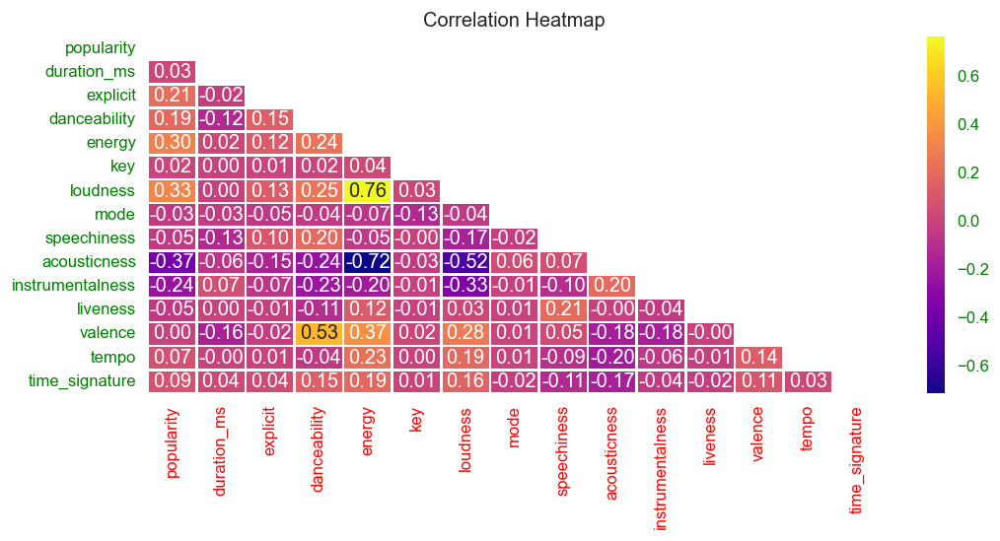

In [15]:
# Correlation matrix using heatmap
with plt.rc_context({'axes.edgecolor':'orange', 'xtick.color':'red', 'ytick.color':'green', 'figure.facecolor':'white'}):
    plt.figure(dpi = 120,figsize= (10,4))
    mask = np.triu(np.ones_like(df.corr(),dtype = bool))
    sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
    plt.yticks(rotation = 0)
    plt.xticks(rotation = 90)
    plt.title('Correlation Heatmap')
    plt.show()

En primer lugar, enfocaremos nuestro análisis sobre la popularidad porque es uno de los campos más importantes en nuestro conjunto de datos para crear un algoritmo de recomendación. La opinión del usuario nos dará información fidedigna sobre una buena recomendación

In [16]:
df.popularity.describe()

count    586672.000000
mean         27.570053
std          18.370642
min           0.000000
25%          13.000000
50%          27.000000
75%          41.000000
max         100.000000
Name: popularity, dtype: float64

Distribución de la `popularidad` (análisis bivariado)

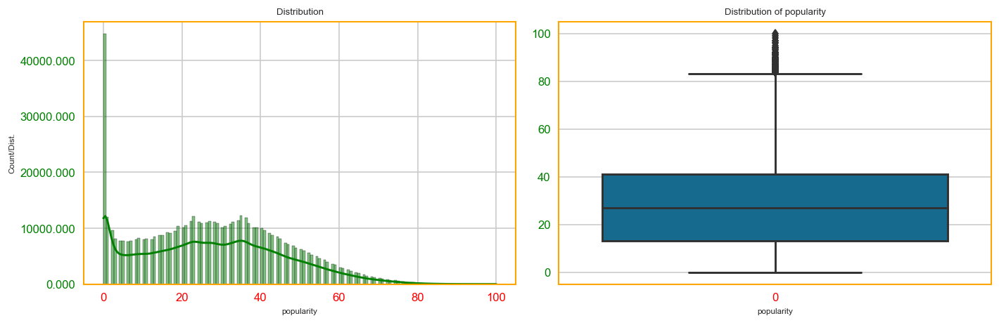

In [17]:
graph_histplot_boxplot(df, 'popularity')

Top 10 de las canciones más populares en el conjunto de datos

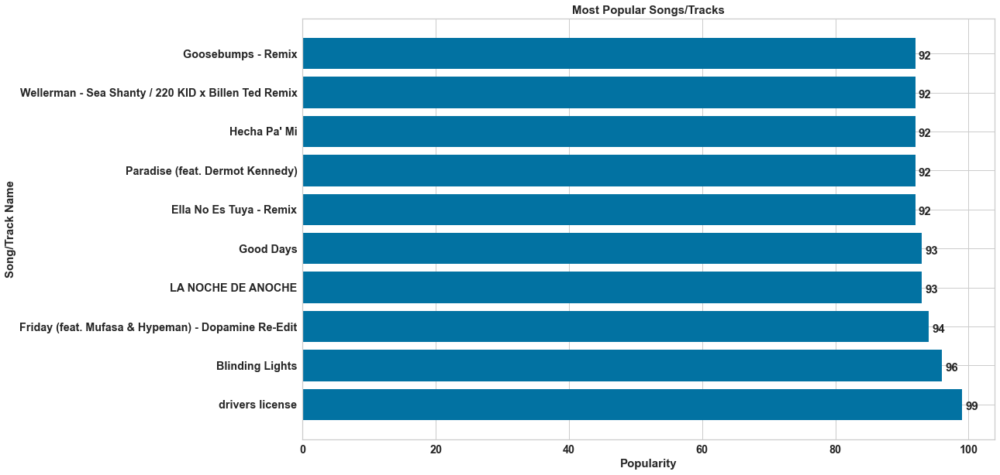

In [18]:
# Get top 10 most popular tracks
popular_songs = df.groupby('name')['popularity'].mean().sort_values(ascending=False).head(10)

# Plot horizontal bar chart
with plt.rc_context({'figure.facecolor':'white'}):
    plt.figure(figsize=(16, 10))
    plt.barh(popular_songs.index, popular_songs)
    plt.title('Most Popular Songs/Tracks', fontdict=dict(fontsize=15), fontweight='bold')
    plt.xlabel('Popularity', fontdict=dict(fontsize=15), fontweight='bold')
    plt.ylabel('Song/Track Name', fontdict=dict(fontsize=15), fontweight='bold')
    plt.xticks(fontsize='large', weight='bold')
    plt.yticks(fontsize='large', weight='bold')
    for i, v in enumerate(popular_songs):
        plt.text(v+0.5, i-0.15, str(int(v)), fontdict=dict(fontsize=15), fontweight='bold')
    plt.show()

In [19]:
get_frec_acum(df, 'popularity')

,Frec_abs,frec_abs_acum,frec_rel_%,frec_rel_%_acum
0,44690,44690,7.6175,7.6175
1,12024,56714,2.0495,9.6670
2,9639,66353,1.6430,11.3100
3,8154,74507,1.3899,12.6999
4,7733,82240,1.3181,14.0180
...,...,...,...,...
96,2,586667,0.0003,99.9991
97,2,586669,0.0003,99.9994
98,1,586670,0.0002,99.9996
99,1,586671,0.0002,99.9998


Vamos a crear un extracto del marco de datos principal (df2) con un valor categórico de `popularidad` (0 a 100) como bajo (<30) o alto (>70) y descartar todos los valores intermedios para que podamos generar un PairPlot para tener un panorama general de la relación entre la popularidad y todas las demás variables

In [20]:
def categorize(row):
    if row['popularity'] < 30:
        val = "low"
    else:
        val = "high"
    return val

# dropeo todos los valores medios para poder hacer el pairplot de nuevo con menos data y mas categorizada o agrupada
df2 = df.drop(df[(df.popularity > 30) & (df.popularity < 70)].index)
df2.drop(['duration_ms', 'mode', 'time_signature', 'explicit', 'key', 'mode'], axis=1, inplace=True)
df2['popularityCategorical'] = df2.apply(categorize, axis=1)
df2.drop(['popularity'], axis=1, inplace=True)
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
danceability,337595.0,0.543155,0.165800,0.0,0.4300,0.556000,0.6660,0.991
energy,337595.0,0.489996,0.255308,0.0,0.2830,0.476000,0.6940,1.000
loudness,337595.0,-11.338780,5.238910,-60.0,-14.1550,-10.552000,-7.5010,5.376
speechiness,337595.0,0.108278,0.193489,0.0,0.0343,0.044000,0.0726,0.971
acousticness,337595.0,0.535791,0.355678,0.0,0.1730,0.597000,0.8770,0.996
instrumentalness,337595.0,0.149264,0.300646,0.0,0.0000,0.000087,0.0467,1.000
liveness,337595.0,0.218927,0.185604,0.0,0.1010,0.144000,0.2850,1.000
valence,337595.0,0.552799,0.262052,0.0,0.3430,0.568000,0.7740,1.000
tempo,337595.0,117.118500,29.755266,0.0,94.6380,115.976000,135.0160,246.381


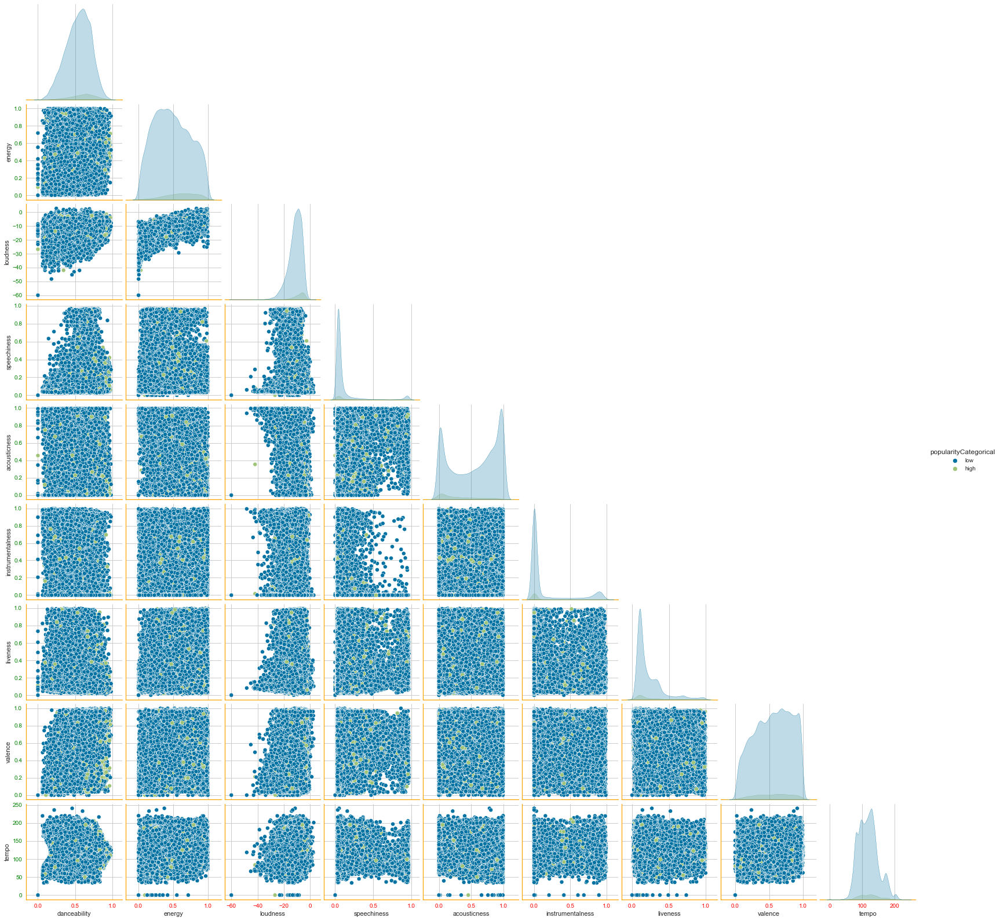

In [21]:
with plt.rc_context({'axes.edgecolor':'orange', 'xtick.color':'red', 'ytick.color':'green', 'figure.facecolor':'white'}):
    sns.pairplot(df2.sample(60000), hue = 'popularityCategorical', corner=True)
    plt.show()

Ahora, generaremos un gráfico de unión para que podamos observar qué tan positiva o negativa es la relación entre la "popularidad" y otras variables.

Joint plot de popularity con otras variables ==> 

Correlacion entre popularity y danceability ==>  0.1869997232129628


<Figure size 500x400 with 0 Axes>

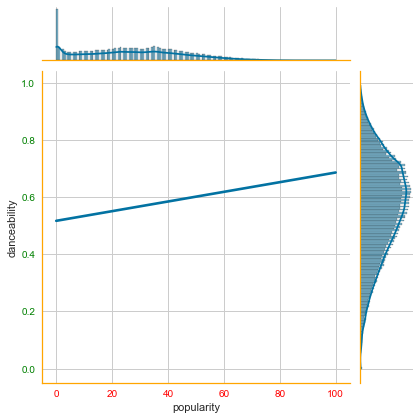

Correlacion entre popularity y energy ==>  0.3023152217928892


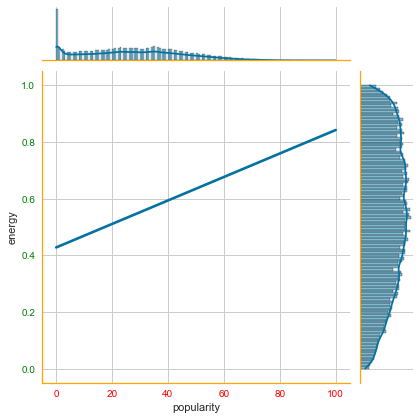

Correlacion entre popularity y loudness ==>  0.3270282258824504


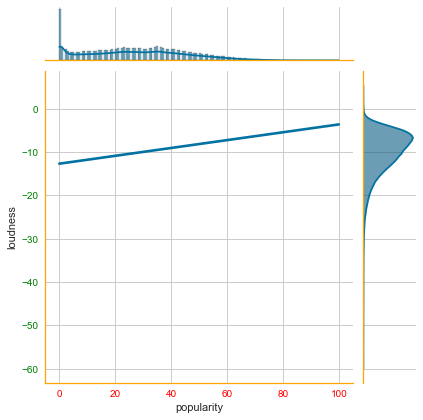

Correlacion entre popularity y speechiness ==>  -0.04735713748414268


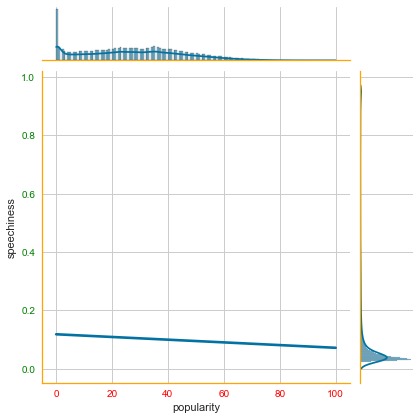

Correlacion entre popularity y acousticness ==>  -0.37088166120332444


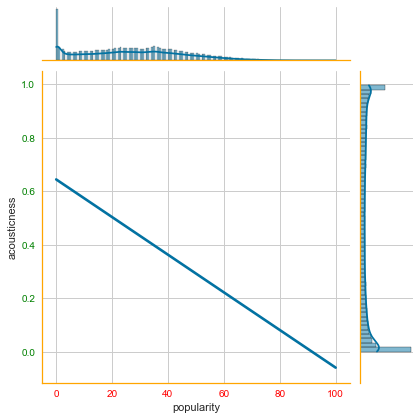

Correlacion entre popularity y instrumentalness ==>  -0.2364873145525719


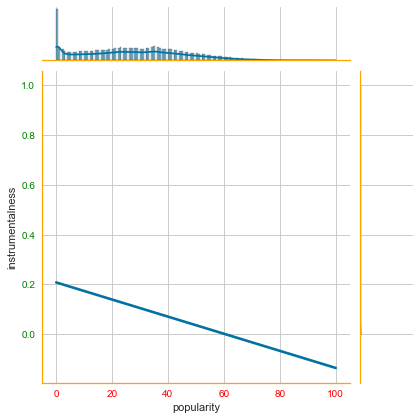

Correlacion entre popularity y liveness ==>  -0.04873992873066526


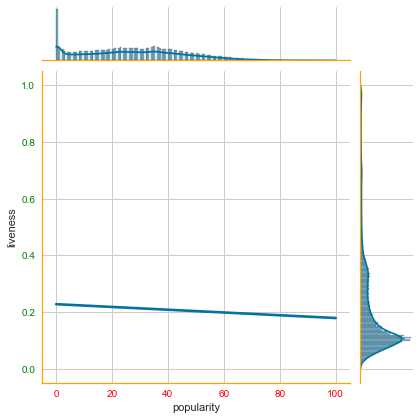

Correlacion entre popularity y valence ==>  0.004643291459072332


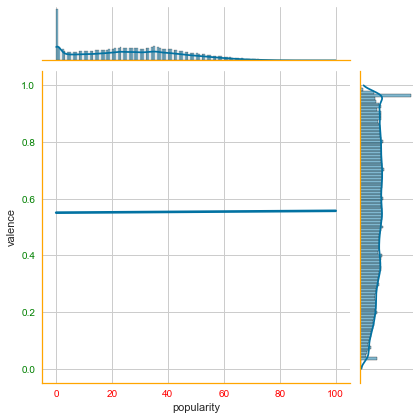

Correlacion entre popularity y tempo ==>  0.07136446416466032


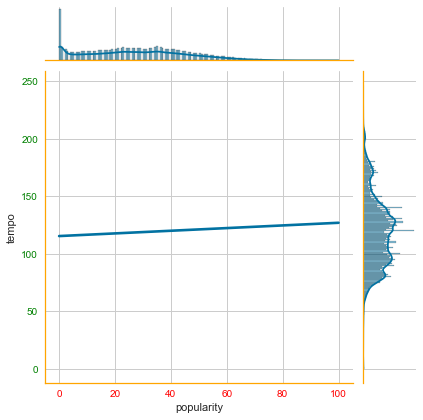

In [22]:
# Drop unnecesary columns
df3 = df.drop(['duration_ms', 'mode', 'time_signature', 'explicit', 'key', 'mode'], axis=1, inplace=False)

#JoinPlot de popularity vs las otras
with plt.rc_context({'axes.edgecolor':'orange', 'xtick.color':'red', 'ytick.color':'green', 'figure.facecolor':'white'}):
    sns.color_palette("Set2")
    plt.figure(dpi = 100, figsize = (5,4))
    print("Joint plot de popularity con otras variables ==> \n")
    for i in  df3.columns:
        if i != 'popularity' and i != 'id' and i != 'name' and i != 'artists' and i != 'id_artists' and i != 'release_date' and i != 'popularityCategorical':
            print(f"Correlacion entre popularity y {i} ==> ",df3.corr().loc['popularity'][i])
            g = sns.jointplot(x='popularity',y=i,data=df,kind = 'reg', scatter = False)
            plt.show()

Podemos ver que las 3 relaciones positivas más fuertes son con la bailabilidad, la energía y la sonoridad. Vamos a analizarlos

Análisis univariado para cada variable

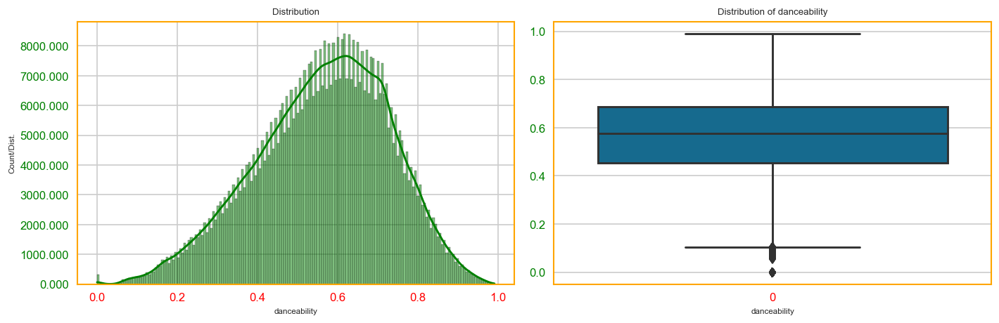

In [23]:
graph_histplot_boxplot(df, 'danceability')

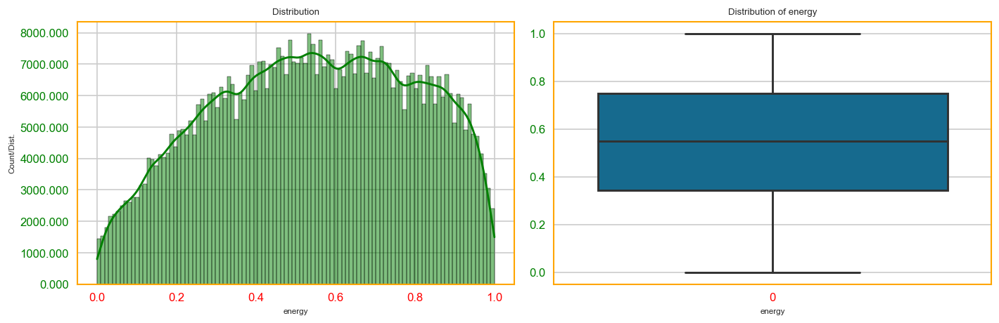

In [24]:
graph_histplot_boxplot(df, 'energy')

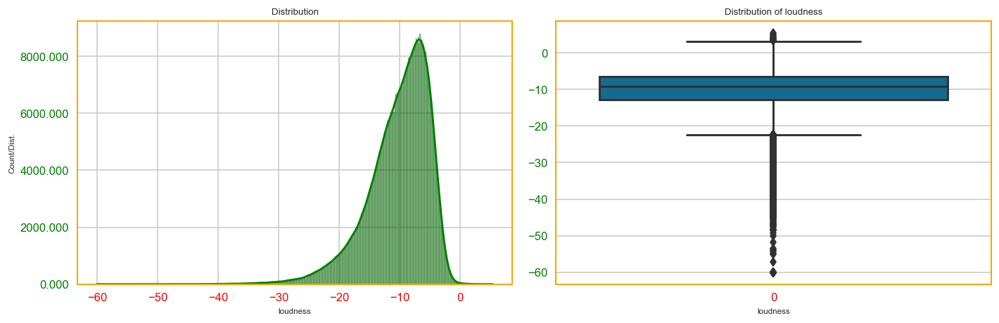

In [25]:
graph_histplot_boxplot(df, 'loudness')

Hagamos unos gráficos sobre la relación con la `popularidad`

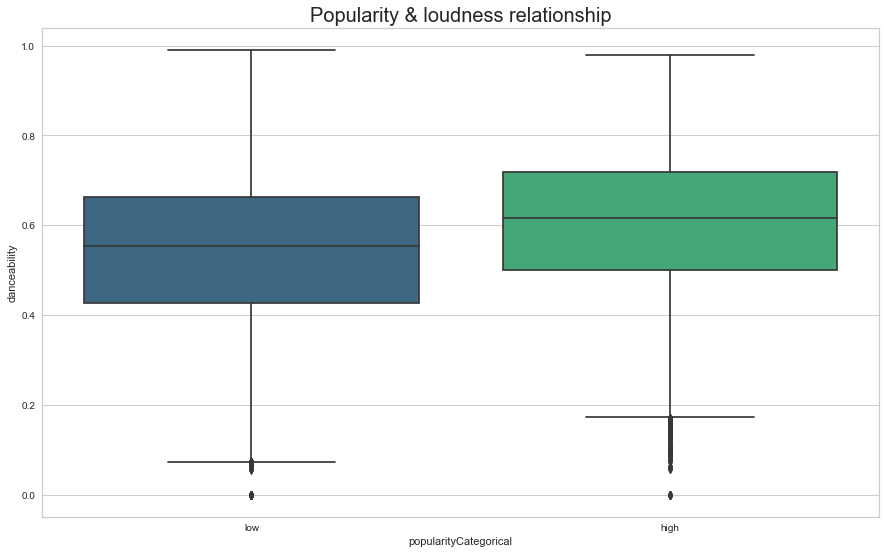

In [26]:
# Popularity vs Danceability
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (15, 9)
    sns.boxplot(x='popularityCategorical', y='danceability', data=df2, palette = 'viridis')
    plt.title('Popularity & loudness relationship', fontsize = 20)
    plt.show()

Podemos ver que cuando la `popularidad` es alta, la canción tiende a ser más `bailable`

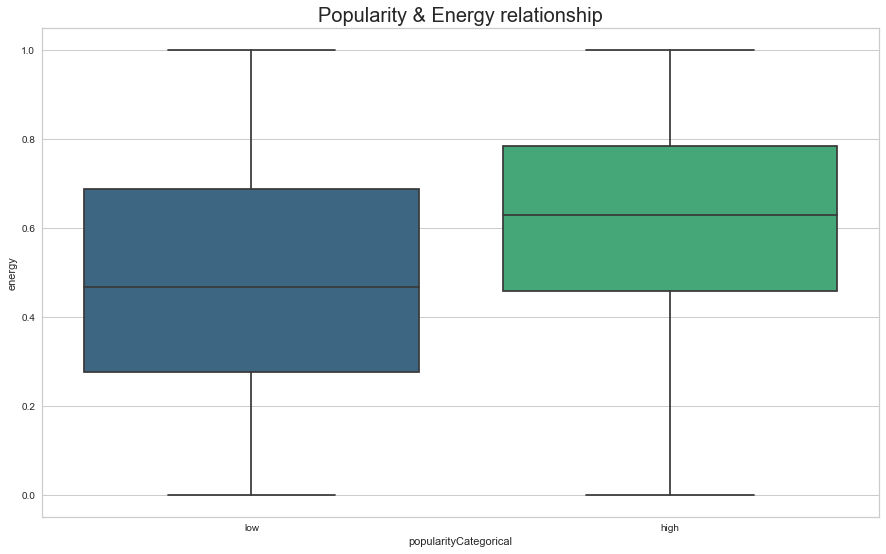

In [27]:
# Popularity vs Energy
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (15, 9)
    sns.boxplot(x='popularityCategorical', y='energy', data=df2, palette = 'viridis')
    plt.title('Popularity & Energy relationship', fontsize = 20)
    plt.show()

Lo mismo para la energía. Podemos ver que cuando la popularidad es alta, la canción tiende a tener más energía, aquí encontramos que la relación positiva es más fuerte que la popularidad frente a la bailabilidad.

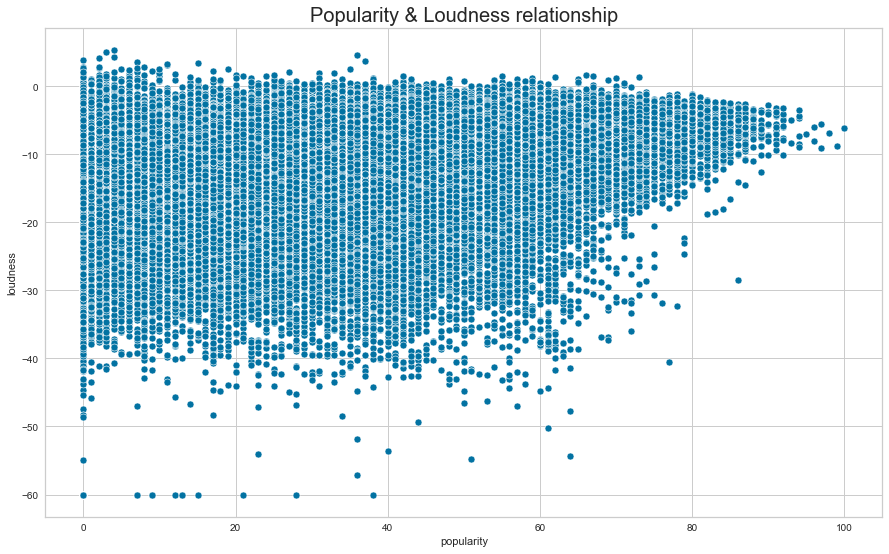

In [28]:
#Popularity vs Loudness
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (15, 9)
    sns.scatterplot(x="popularity", y="loudness", data=df)
    plt.title('Popularity & Loudness relationship', fontsize = 20, fontweight = 30)

Y finalmente, usando un diagrama de dispersión, podemos ver que alcanzando una alta popularidad, el volumen tiende a aumentar a un rango entre 0 y -10

Durante este análisis, hemos creado 3 marcos de datos:
1. `df` es el completo
2. `df2` es un marco de datos filtrado, categorizado por popularidad y eliminamos todas las filas entre 30 < `popularidad` < 70 (más claro para un análisis sólido o dibujar gráficos pesados)
3. `df3` es lo mismo que `df` pero eliminamos todas las columnas innecesarias para crear gráficos

In [29]:
original_df = df
filtered_categorized_df = df2
filtered_df = df3

Vamos a aplicar un algoritmo de clustering K-means. 

En primera instancia tomamos las columnas que vamos a considerar para el analisis y generamos un dataframe para entrenar el modelo denominado `df_fit`.

In [30]:
df_fit = original_df[original_df.columns[np.r_[2, 8:20]]]
df_fit

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,6,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3
1,0,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1
2,0,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5
3,0,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3
4,0,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,50,0.560,0.5180,0,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4
586668,72,0.765,0.6630,0,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4
586669,70,0.535,0.3140,7,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4
586670,58,0.696,0.6150,10,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4


Luego se normaliza el dataframe para que las variables con un rango más amplio de features no generen una desproporción en el criterio de agrupamiento. De esta  manera generamos un nuevo dataframe llamado `df_fit_normal` con valores de feature entre 0 y 1.

In [82]:
scaler = preprocessing.MinMaxScaler()
df_fit_normal = scaler.fit_transform(df_fit)
df_fit_normal = pd.DataFrame(df_fit_normal)
df_fit_normal.columns = df_fit.columns
df_fit_normal

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,0.06,0.650858,0.4450,0.000000,0.713748,1.0,0.464470,0.676707,0.744000,0.1510,0.1270,0.425564,0.6
1,0.00,0.701312,0.2630,0.000000,0.579173,1.0,0.985582,0.800201,0.000000,0.1480,0.6550,0.414029,0.2
2,0.00,0.437941,0.1770,0.090909,0.593796,1.0,0.052729,0.997992,0.021800,0.2120,0.4570,0.529335,1.0
3,0.00,0.323915,0.0946,0.636364,0.490073,1.0,0.051905,0.998996,0.918000,0.1040,0.3970,0.689907,0.6
4,0.00,0.405651,0.1580,0.272727,0.659263,0.0,0.040165,0.992972,0.130000,0.3110,0.1960,0.418945,0.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...
586667,0.50,0.565086,0.5180,0.000000,0.803491,0.0,0.030072,0.788153,0.000000,0.0648,0.2110,0.535333,0.8
586668,0.72,0.771948,0.6630,0.000000,0.837876,1.0,0.067147,0.141566,0.000297,0.0924,0.6860,0.609183,0.8
586669,0.70,0.539859,0.3140,0.636364,0.721626,0.0,0.042019,0.898594,0.000150,0.0874,0.0663,0.588905,0.8
586670,0.58,0.702321,0.6150,0.909091,0.822748,1.0,0.035530,0.206827,0.000003,0.3050,0.4380,0.365406,0.8


Se utiliza el método del codo para determinar el número de clusters que se van a utilizar.

In [32]:
inertia = []
K = np.arange(1,15)
for k in K:
 kmeanModel = KMeans(n_clusters=k).fit(df_fit_normal)
 kmeanModel.fit(df_fit_normal)
 inertia.append(kmeanModel.inertia_)

Text(0, 0.5, 'Inertia')

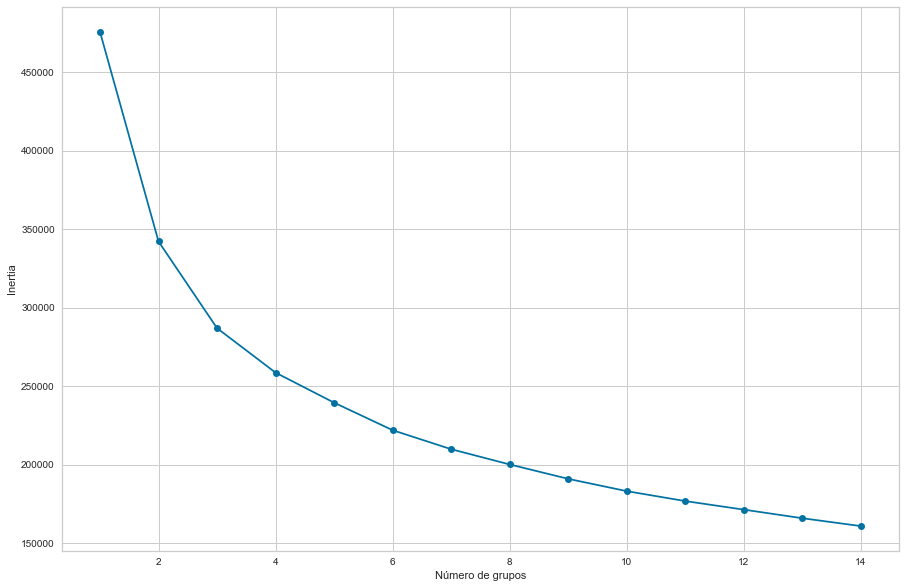

In [33]:
plt.figure(figsize=(15,10))
plt.plot(K,inertia, '-o')
plt.xlabel('Número de grupos')
plt.ylabel('Inertia')

Se determina que a partir de los 6 clusters hay un cambio de pendiente en la inercia y se toma dicho valor para el análisis.

In [84]:
# Creando el k-Means para los 6 grupos encontrados
kmeans = KMeans(n_clusters = 6, init = 'k-means++', random_state = 42) #k-means++ acelera la convergencia, respecto de random
y_kmeans = kmeans.fit_predict(df_fit_normal)

In [85]:
df_fit_normal['cluster'] = y_kmeans

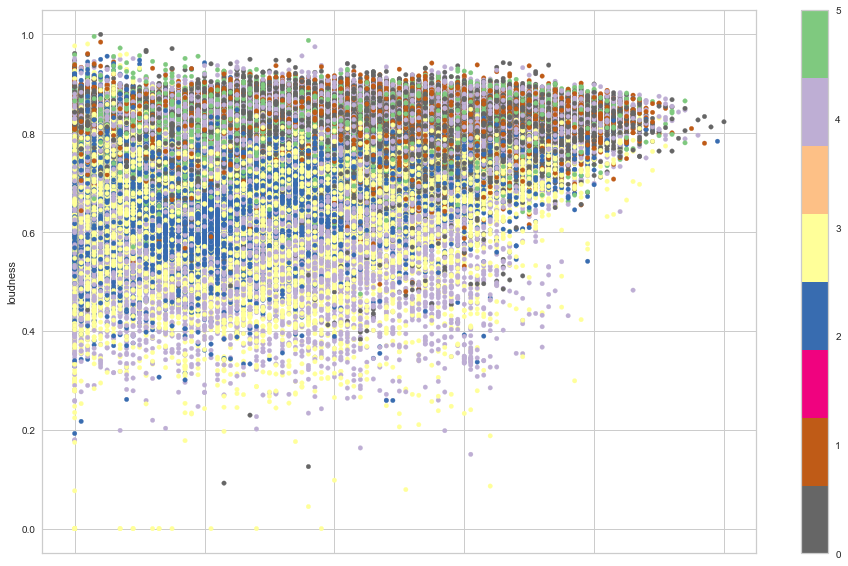

In [62]:
# Analizamos popularidad contra volumen 
df_fit_normal.plot(kind="scatter", x="popularity", y="loudness", c=y_kmeans, cmap='Accent_r', figsize=(16,10))

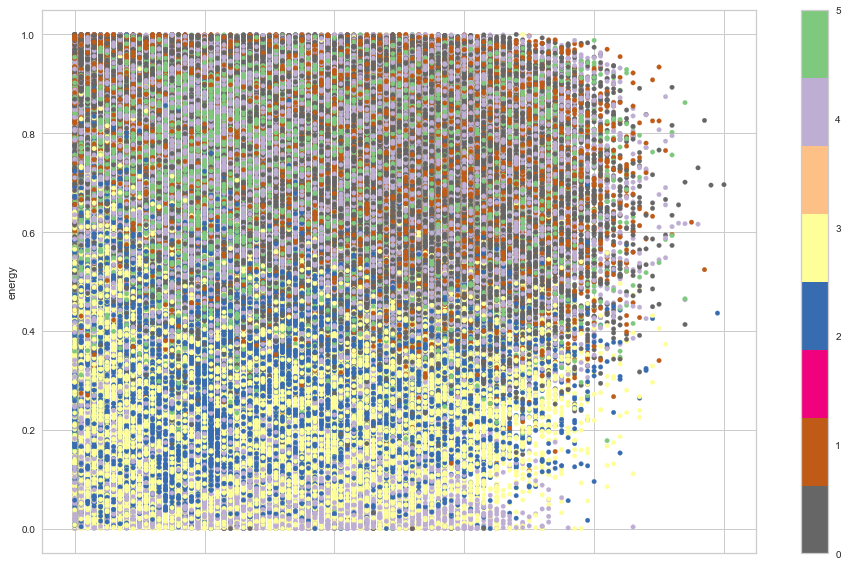

In [63]:
# Analizamos popularidad contra energía 
df_fit_normal.plot(kind="scatter", x="popularity", y="energy", c=y_kmeans, cmap='Accent_r', figsize=(16,10))

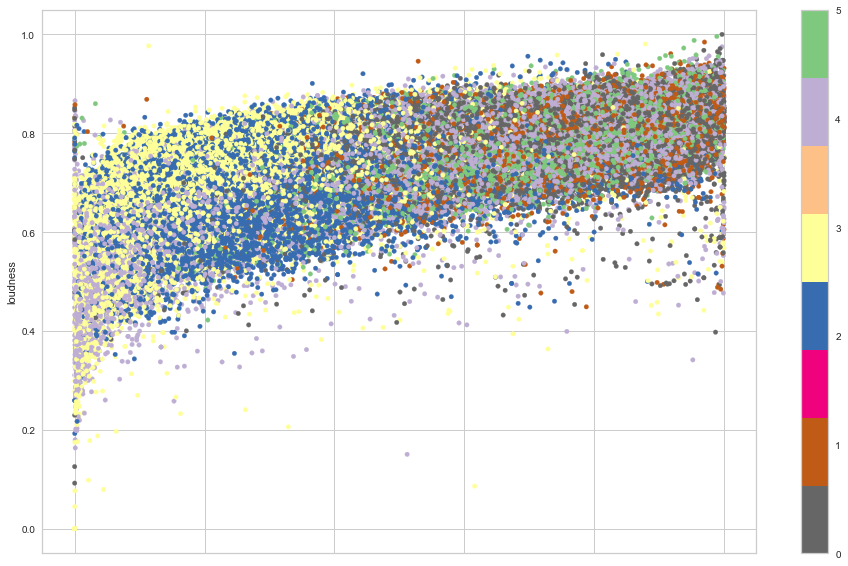

In [64]:
# Analizamos enrgia contra volumen 
df_fit_normal.plot(kind="scatter", x="energy", y="loudness", c=y_kmeans, cmap='Accent_r', figsize=(16,10))

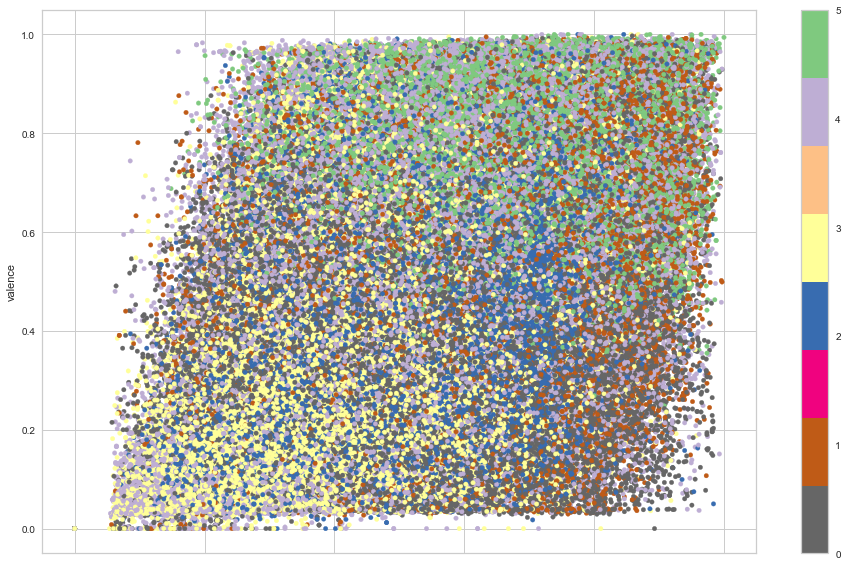

In [65]:
# Analizamos danzabnilidad contra positividad 
df_fit_normal.plot(kind="scatter", x="danceability", y="valence", c=y_kmeans, cmap='Accent_r', figsize=(16,10))

Ya que la visualización de los cluster se dificulta, intentamos nuevamente utilizar el metodo PCA, pero esta vez reduciendo el modelo a solo 2 componentes principales. Generamos un nuevo dataset `pca_df3`  que contendrá los componentes principales obtenidos en el PCA y los distintos clusters.

In [113]:
pca = PCA(n_components=2)
pca_df = pca.fit_transform(df_fit_normal)
pca_df2 = pd.DataFrame(data = pca_df, columns = ['Comp1', 'Comp2'])
pca_df3 = pd.concat([pca_df2, df_fit_normal['cluster']], axis=1)

pca_df3

,Comp1,Comp2,cluster
0,1.741188,0.120906,4
1,2.729587,0.083316,5
2,2.752070,0.228831,5
3,1.774522,0.452369,4
4,-0.330294,0.980154,2
...,...,...,...
586667,-0.389484,0.629803,2
586668,0.635004,-0.590402,3
586669,-0.392585,0.805522,2
586670,-1.333961,-0.453395,1


Text(0.5, 1.0, 'Clusters of Spotify Songs')

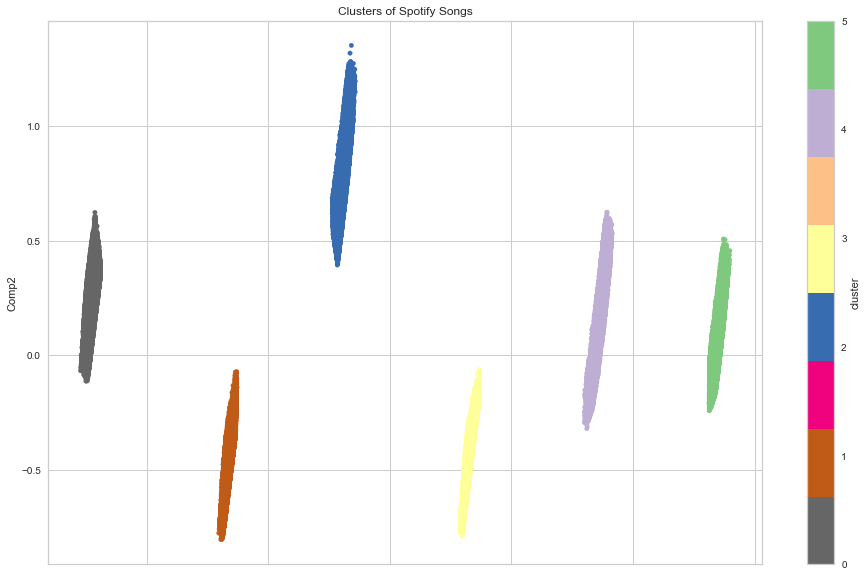

In [114]:
# Visualizamos los cluster a partir del nuevo dataset `pca_df3`
pca_df3.plot(kind="scatter", x="Comp1", y="Comp2", c="cluster", cmap='Accent_r', figsize=(16,10))
plt.title('Clusters of Spotify Songs')